In [1]:
import numpy as np
import pandas as pd
import gget
import glob
import scanpy as sc
import networkx as nx
from scipy.stats import entropy
import os
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from importlib import reload

# locals 
import regulatory_network as grn
import isoforms as iso
import utils as ut

In [2]:
fpath = "/scratch/indikar_root/indikar1/cstansbu/HSC/scanpy/clustered.anndata.h5ad"

adata = sc.read_h5ad(fpath)
adata.uns['X_umap'] = adata.obsm['X_umap']
adata.var_names = adata.var['gene_name']
adata

AnnData object with n_obs × n_vars = 8574 × 15065
    obs: 'n_genes', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_name', 'Chromosome', 'Start', 'End', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'ensembl_id'
    uns: 'HSC_vs_FB', 'HSC_vs_FB_pure', 'clusters', 'fb_vs_hsc_up', 'go_annotations', 'hsc_v_fib_up', 'hvg', 'log1p', 'neighbors', 'panglaodb', 'pca', 'scenic_transcription_factors', 'scrublet', 'tabula_sapiens_deg', 'umap', 'v5_tags', 'X_umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'filtered_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [3]:
# loaad the scenic database
sdf = grn.load_scenic_database()
sdf.head()

,ABL1,ACAA1,ADNP,ADNP2,AEBP2,AFF4,AHCTF1,AHDC1,AHR,AHRR,...,ZSCAN32,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN5C,ZSCAN9,ZXDA,ZXDB,ZXDC,ZZZ3
gene_name,,,,,,,,,,,,,,,,,,,,,
A1BG,1.65,0.0,5.060,0.0,0.0,8.470,6.400,2.290,0.83060,0.0,...,0.0,0.0,0.0,0.0,1.32,1.448,1.790,1.484333,0.0,1.37
A1BG-AS1,0.00,0.0,0.545,0.0,0.0,0.379,0.000,0.000,0.14640,0.0,...,0.0,0.0,0.0,0.0,0.00,0.770,1.465,1.032333,0.0,0.00
A1CF,1.55,0.0,0.000,0.0,0.0,3.780,4.880,1.092,0.31400,0.0,...,0.0,0.0,0.0,0.0,0.00,0.920,2.865,1.910000,0.0,2.67
A2M,1.39,0.0,0.827,0.0,0.0,4.700,0.810,1.055,0.27314,0.0,...,0.0,0.0,0.0,0.0,0.00,0.535,0.885,0.698000,0.0,3.45
A2M-AS1,0.00,0.0,0.000,0.0,0.0,1.450,0.111,0.000,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.00,0.800,0.000,0.059333,0.0,0.00


In [4]:
# build a condensed expression table
stats = ut.calculate_gene_expression_stats(adata.to_df())
stats = stats.reset_index()
stats.head()

,gene_name,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
0,CEACAM3,5.830416,5.987309,0.553027,8574,100.00
1,MINDY1,4.918147,4.960259,0.597197,8562,99.86
2,PSEN2,4.812243,4.864729,0.421894,8555,99.78
3,ATG12,4.765070,4.936301,0.932989,8555,99.78
4,TMEM168,4.730296,4.767966,0.414730,8551,99.73


In [5]:
adata.uns.keys()

dict_keys(['HSC_vs_FB', 'HSC_vs_FB_pure', 'clusters', 'fb_vs_hsc_up', 'go_annotations', 'hsc_v_fib_up', 'hvg', 'log1p', 'neighbors', 'panglaodb', 'pca', 'scenic_transcription_factors', 'scrublet', 'tabula_sapiens_deg', 'umap', 'v5_tags', 'X_umap'])

In [6]:
# Test an example pathway
pathway = "hematopoietic stem cell homeostasis"
db = adata.uns['go_annotations']
genes = db[db['go_biological_process'] == pathway]['gene_name'].values
genes

array(['SEPTIN4', 'GATA2', 'CCN3', 'ADAR', 'SOX4', 'ARHGEF5', 'FSTL1',
       'UBAP2L', 'UBAP2L', 'UBAP2L', 'EMCN', 'OCIAD2', 'NBEA', 'MYCT1',
       'BAP1', 'GPRASP2', 'GLIS2', 'CRISPLD1', 'NLE1', 'OCIAD1', 'EMCN',
       'ADGRG1'], dtype=object)

In [7]:
gene_stats = stats[stats['gene_name'].isin(genes)]
G = grn.create_scenic_network(gene_stats, sdf)
print(G)

DiGraph with 17 nodes and 51 edges


/home/cstansbu/git_repositories/ONT-single-cell/notebooks/regulatory_network.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_expression_df['is_tf'] = gene_expression_df['gene_name'].isin(active_tfs)


/home/cstansbu/miniconda3/envs/scanpy/lib/python3.12/site-packages/networkx/drawing/layout.py:725: RuntimeWarning: divide by zero encountered in divide
  costargs = (np, 1 / (dist_mtx + np.eye(dist_mtx.shape[0]) * 1e-3), meanwt, dim)


Text(0.5, 1.0, 'Hematopoietic stem cell homeostasis')

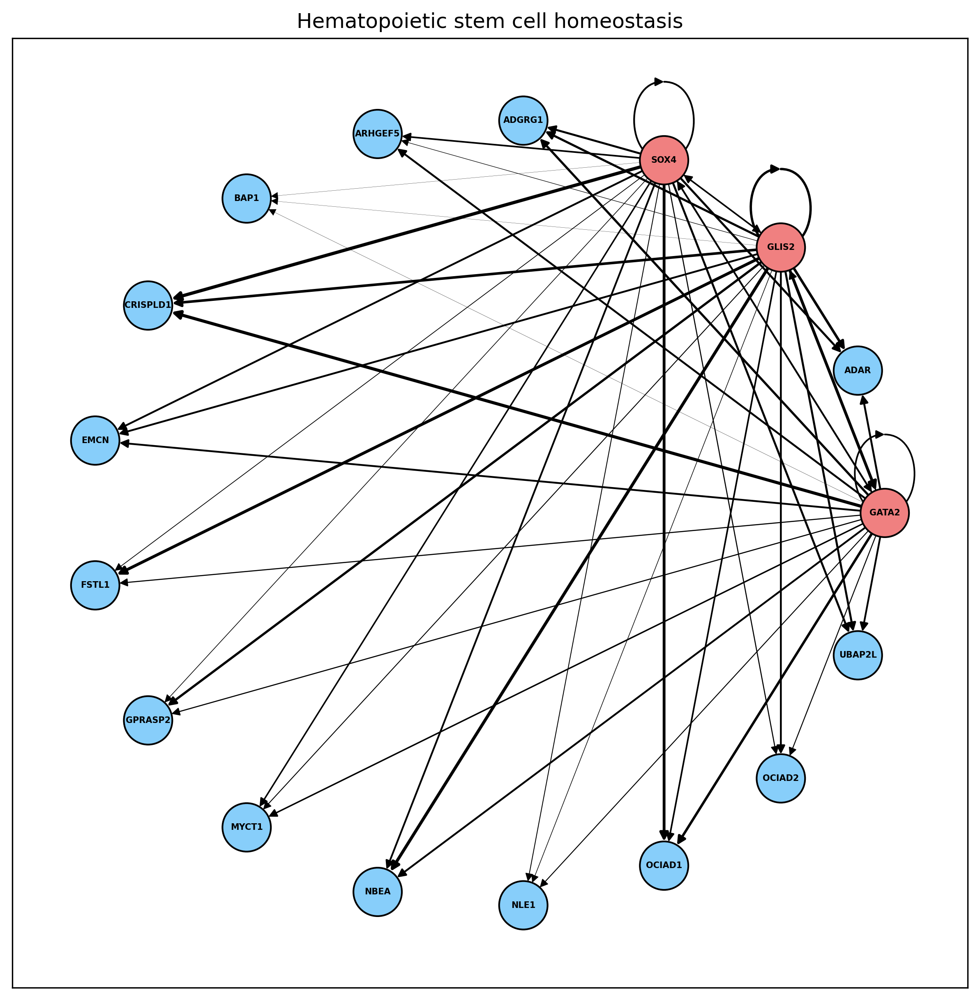

In [8]:
reload(grn)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 10

grn.visualize_network(G)

plt.title("Hematopoietic stem cell homeostasis")

/tmp/ipykernel_1088334/1879433268.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  edge_cmap = plt.cm.get_cmap('binary'),


Text(0.5, 1.0, 'Hematopoietic stem cell homeostasis')

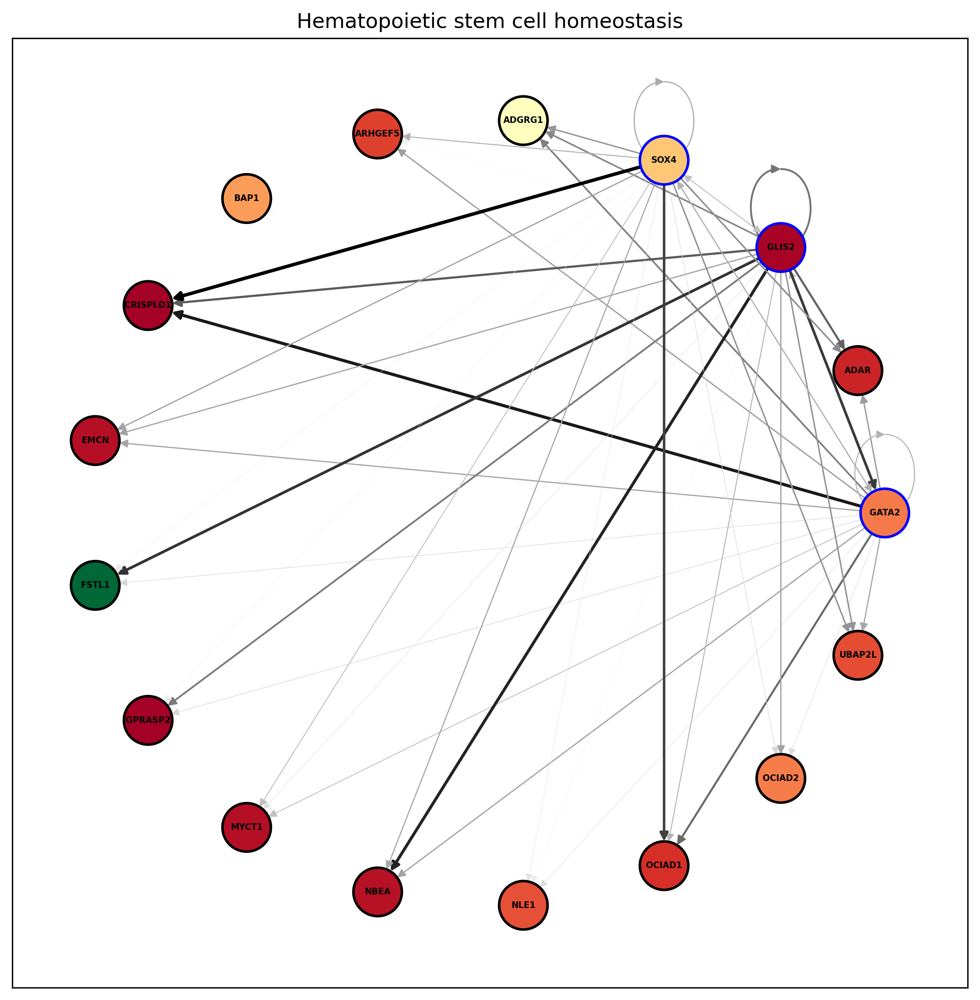

In [9]:
reload(grn)
reload(ut)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 10

feature_column = "percent_nonzero"

pos = nx.kamada_kawai_layout(G)

colors = np.array([G.nodes[n].get(feature_column) for n in G.nodes]) 
ecolors = ["blue" if G.nodes[n].get("is_tf", False) else "k" for n in G.nodes]
edge_weights = ut.min_max(np.array(list(nx.get_edge_attributes(G, "weight").values())))
edge_weights = edge_weights * 2

# Draw the graph
nx.draw_networkx(G, pos, 
        node_color=colors,
        edgecolors=ecolors, #color of node border
        node_shape='o',
        cmap='RdYlGn',
        node_size = 800,
        linewidths = 1.5,
        with_labels = True,
        font_color = "k",
        font_size = 5,
        font_family = "sans-serif",
        font_weight = "bold",
        horizontalalignment = "center",
        verticalalignment = "center",
        edge_cmap = plt.cm.get_cmap('binary'),
        edge_color = edge_weights,
        width = edge_weights,
        arrows = True,
        arrowsize = 10,
)

plt.title("Hematopoietic stem cell homeostasis")

/home/cstansbu/git_repositories/ONT-single-cell/notebooks/regulatory_network.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_expression_df['is_tf'] = gene_expression_df['gene_name'].isin(active_tfs)
/home/cstansbu/miniconda3/envs/scanpy/lib/python3.12/site-packages/networkx/drawing/layout.py:725: RuntimeWarning: divide by zero encountered in divide
  costargs = (np, 1 / (dist_mtx + np.eye(dist_mtx.shape[0]) * 1e-3), meanwt, dim)
/tmp/ipykernel_1088334/2902745551.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  edge_cmap = plt.cm.get_cmap('binary'),


Text(0.5, 1.0, 'Hematopoietic Stem Cell Differentiation')

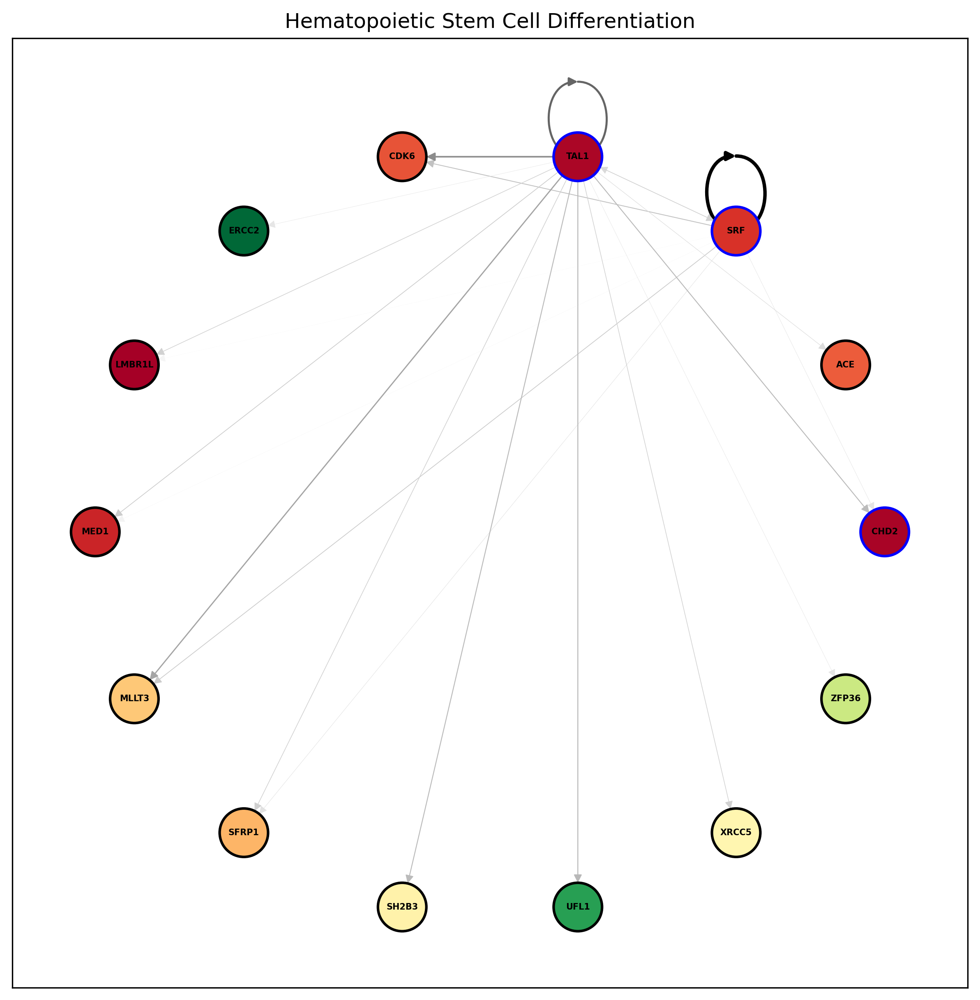

In [10]:
# Test an example pathway
pathway = "hematopoietic stem cell differentiation"
db = adata.uns['go_annotations']
genes = db[db['go_biological_process'] == pathway]['gene_name'].values

gene_stats = stats[stats['gene_name'].isin(genes)]
G = grn.create_scenic_network(gene_stats, sdf)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 10

feature_column = "percent_nonzero"

pos = nx.kamada_kawai_layout(G)

colors = np.array([G.nodes[n].get(feature_column) for n in G.nodes]) 
ecolors = ["blue" if G.nodes[n].get("is_tf", False) else "k" for n in G.nodes]
edge_weights = ut.min_max(np.array(list(nx.get_edge_attributes(G, "weight").values())))
edge_weights = edge_weights * 2

# Draw the graph
nx.draw_networkx(G, pos, 
        node_color=colors,
        edgecolors=ecolors, #color of node border
        node_shape='o',
        cmap='RdYlGn',
        node_size = 800,
        linewidths = 1.5,
        with_labels = True,
        font_color = "k",
        font_size = 5,
        font_family = "sans-serif",
        font_weight = "bold",
        horizontalalignment = "center",
        verticalalignment = "center",
        edge_cmap = plt.cm.get_cmap('binary'),
        edge_color = edge_weights,
        width = edge_weights,
        arrows = True,
        arrowsize = 10,
)

plt.title(pathway.title())

/home/cstansbu/git_repositories/ONT-single-cell/notebooks/regulatory_network.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_expression_df['is_tf'] = gene_expression_df['gene_name'].isin(active_tfs)
/tmp/ipykernel_1088334/1257519498.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  edge_cmap = plt.cm.get_cmap('binary'),


Text(0.5, 1.0, 'Hematopoietic Stem Cell Proliferation')

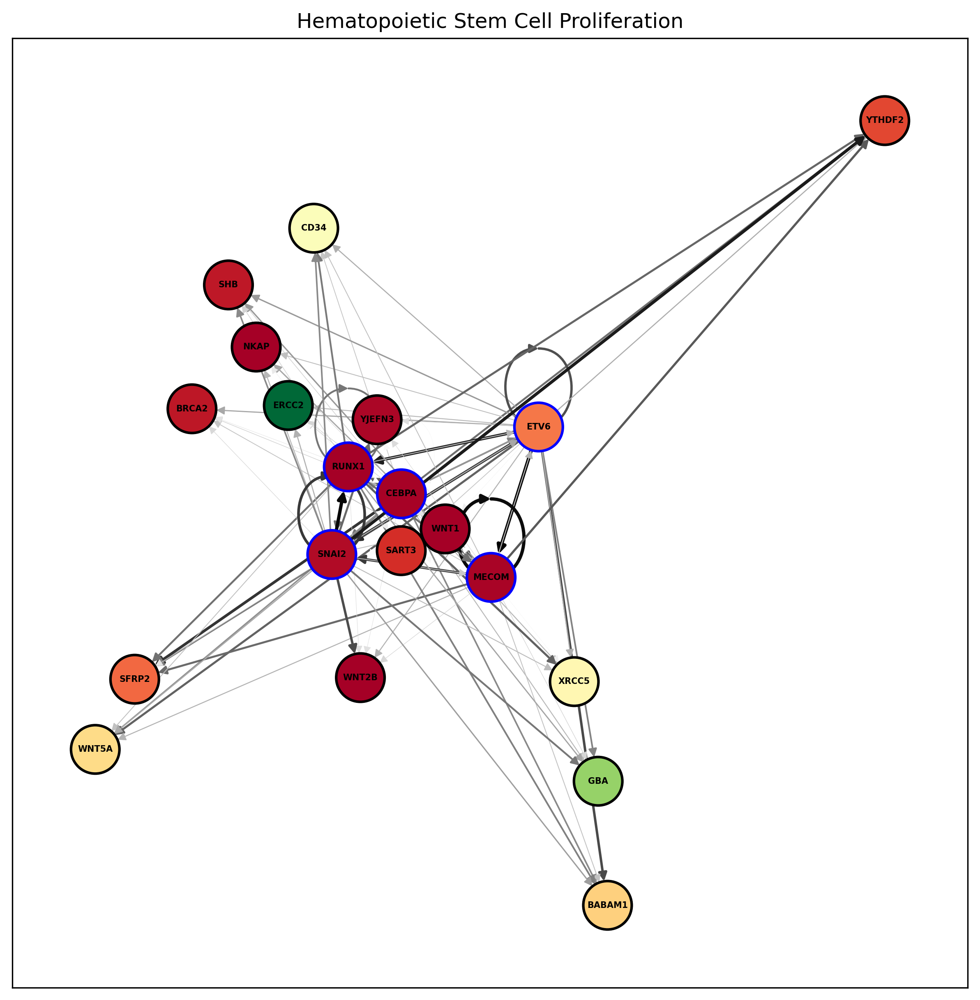

In [11]:
# Test an example pathway
pathway = "hematopoietic stem cell proliferation"
db = adata.uns['go_annotations']
genes = db[db['go_biological_process'] == pathway]['gene_name'].values

gene_stats = stats[stats['gene_name'].isin(genes)]
G = grn.create_scenic_network(gene_stats, sdf)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 10

feature_column = "percent_nonzero"

pos = nx.kamada_kawai_layout(G)

colors = np.array([G.nodes[n].get(feature_column) for n in G.nodes]) 
ecolors = ["blue" if G.nodes[n].get("is_tf", False) else "k" for n in G.nodes]
edge_weights = ut.min_max(np.array(list(nx.get_edge_attributes(G, "weight").values())))
edge_weights = edge_weights * 2

# Draw the graph
nx.draw_networkx(G, pos, 
        node_color=colors,
        edgecolors=ecolors, #color of node border
        node_shape='o',
        cmap='RdYlGn',
        node_size = 800,
        linewidths = 1.5,
        with_labels = True,
        font_color = "k",
        font_size = 5,
        font_family = "sans-serif",
        font_weight = "bold",
        horizontalalignment = "center",
        verticalalignment = "center",
        edge_cmap = plt.cm.get_cmap('binary'),
        edge_color = edge_weights,
        width = edge_weights,
        arrows = True,
        arrowsize = 10,
)

plt.title(pathway.title())

/tmp/ipykernel_1088334/3272873637.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_stats['gene_type'] = np.where(gene_stats['gene_name'].isin(sdf.columns), "TF", "Gene")
/tmp/ipykernel_1088334/3272873637.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_stats['gene_type'] = np.where(gene_stats['gene_name'].isin(TFs), "RP", gene_stats['gene_type'])
/home/cstansbu/git_repositories/ONT-single-cell/notebooks/regulatory_network.py:59: SettingWithCopyWarning: 
A value is trying to be set on a cop

Text(0.5, 1.0, 'Reprogramming Factors and HSC Genes')

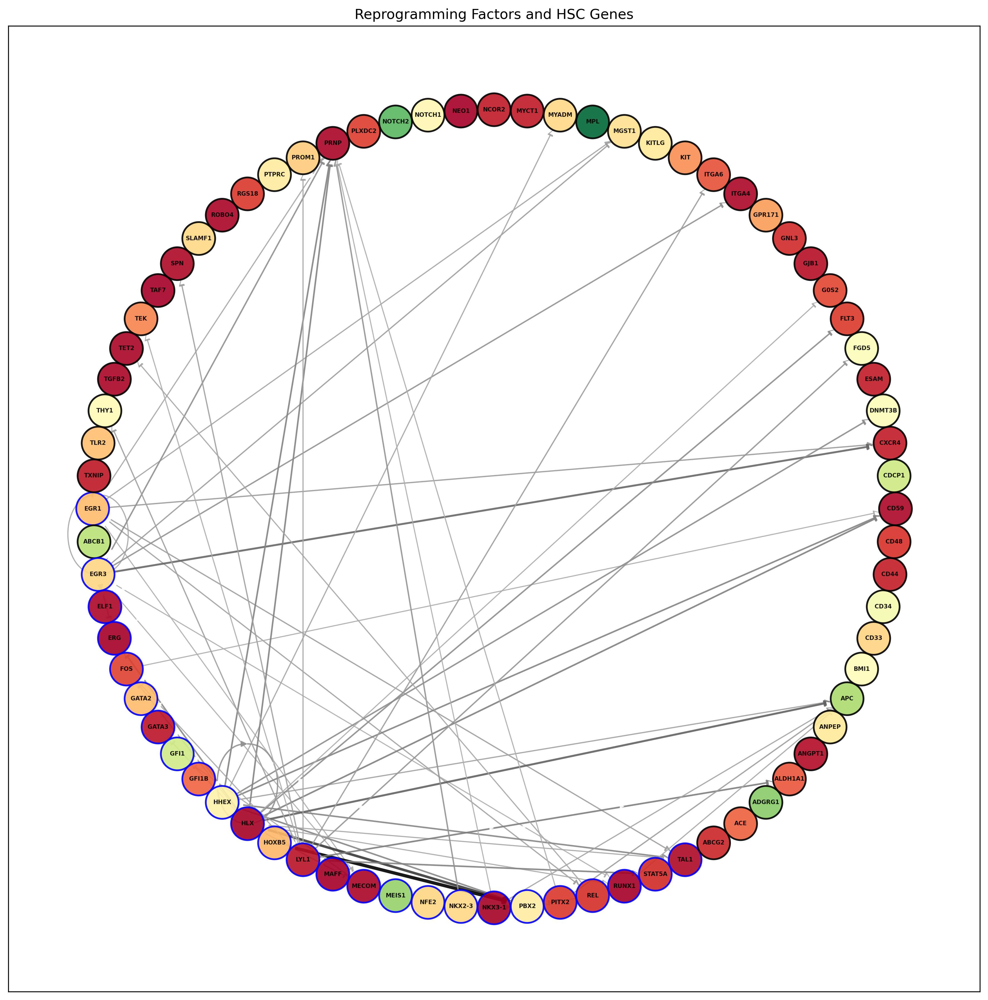

In [55]:
# The input TFS and HSC genes
db = adata.uns['panglaodb']
genes = db[db['cell_type'] == 'Hematopoietic stem cells']['gene_name'].to_list()

TFs = [
    'GATA2', 
    'GFI1B',
    'STAT5A',
    'REL',
    'FOS',
]
# add the TFs
genes = sorted(list(set(TFs + genes)))

gene_stats = stats[stats['gene_name'].isin(genes)]

# add typing information
gene_stats['gene_type'] = np.where(gene_stats['gene_name'].isin(sdf.columns), "TF", "Gene")
gene_stats['gene_type'] = np.where(gene_stats['gene_name'].isin(TFs), "RP", gene_stats['gene_type'])

gene_stats['gene_type'].value_counts()

G = grn.create_scenic_network(gene_stats, sdf)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 15

feature_column = "percent_nonzero"

pos = nx.kamada_kawai_layout(G)
# pos = nx.spring_layout(G)
# pos = nx.spectral_layout(G)
pos = nx.shell_layout(G)
# pos = nx.multipartite_layout(G, subset_key='gene_type')

colors = np.array([G.nodes[n].get(feature_column) for n in G.nodes]) 
ecolors = ["blue" if G.nodes[n].get("is_tf", False) else "k" for n in G.nodes]
edge_weights = ut.min_max(np.array(list(nx.get_edge_attributes(G, "weight").values())))

e_thresh = 0.25
edge_weights = np.where(edge_weights > e_thresh, edge_weights, 0)
edge_weights = np.log1p(edge_weights) * 4

# Draw the graph
nx.draw_networkx(G, pos, 
        node_color=colors,
        edgecolors=ecolors, #color of node border
        node_shape='o',
        cmap='RdYlGn',
        node_size = 800,
        linewidths = 1.5,
        with_labels = True,
        font_color = "k",
        font_size = 5,
        font_family = "sans-serif",
        font_weight = "bold",
        horizontalalignment = "center",
        verticalalignment = "center",
        edge_cmap = plt.cm.get_cmap('binary'),
        edge_color = edge_weights,
        alpha=0.9,         
        width = edge_weights,
        arrows = True,
        arrowsize = 10,
)

plt.title("Reprogramming Factors and HSC Genes")

/tmp/ipykernel_1088334/901002950.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_stats['gene_type'] = np.where(gene_stats['gene_name'].isin(sdf.columns), "TF", "Gene")
/tmp/ipykernel_1088334/901002950.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_stats['gene_type'] = np.where(gene_stats['gene_name'].isin(TFs), "RP", gene_stats['gene_type'])
/home/cstansbu/git_repositories/ONT-single-cell/notebooks/regulatory_network.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy 

Text(0.5, 1.0, 'Reprogramming Factors and Fibroblast Genes')

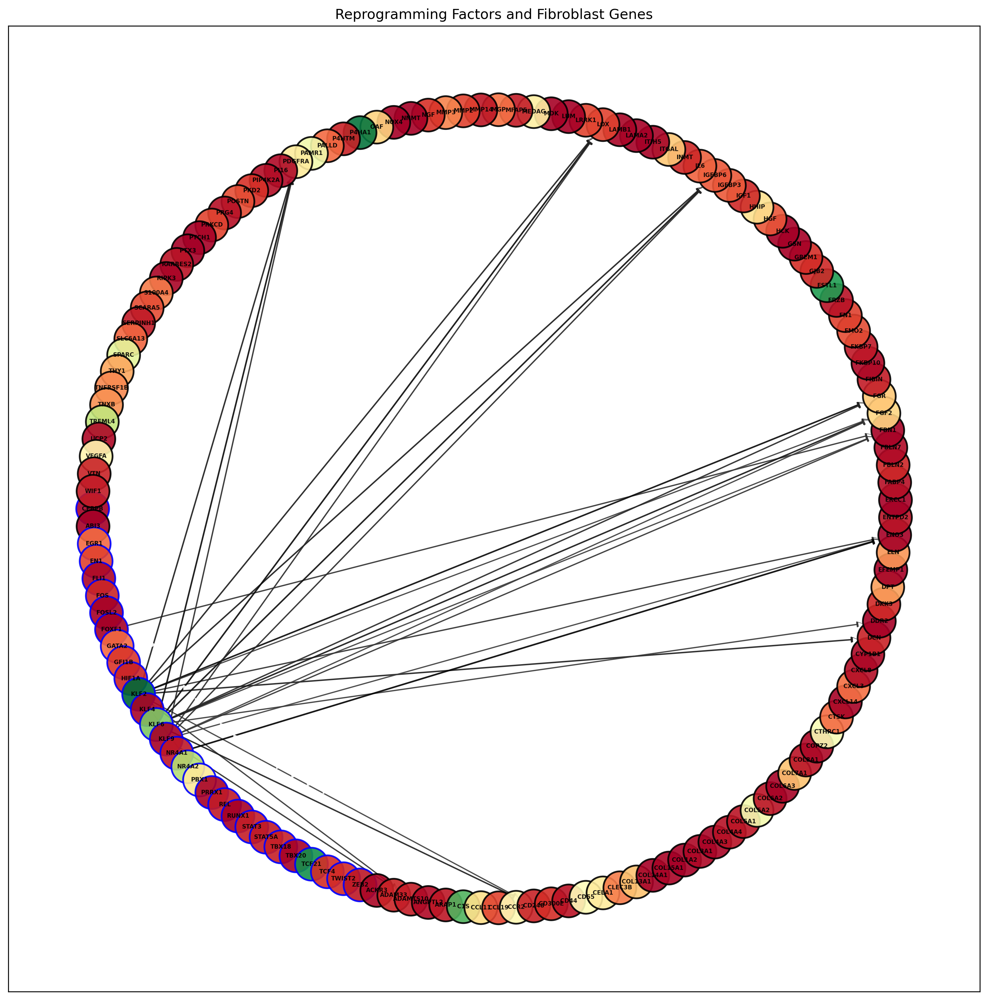

In [54]:
# The input TFS and FB genes
db = adata.uns['panglaodb']
genes = db[db['cell_type'] == 'Fibroblasts']['gene_name'].to_list()

TFs = [
    'GATA2', 
    'GFI1B',
    'STAT5A',
    'REL',
    'FOS',
]
# add the TFs
genes = sorted(list(set(TFs + genes)))

gene_stats = stats[stats['gene_name'].isin(genes)]

# add typing information
gene_stats['gene_type'] = np.where(gene_stats['gene_name'].isin(sdf.columns), "TF", "Gene")
gene_stats['gene_type'] = np.where(gene_stats['gene_name'].isin(TFs), "RP", gene_stats['gene_type'])

gene_stats['gene_type'].value_counts()

G = grn.create_scenic_network(gene_stats, sdf)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 15

feature_column = "percent_nonzero"

pos = nx.kamada_kawai_layout(G)
# pos = nx.spring_layout(G)
# pos = nx.spectral_layout(G)
pos = nx.shell_layout(G)
# pos = nx.multipartite_layout(G, subset_key='gene_type')

colors = np.array([G.nodes[n].get(feature_column) for n in G.nodes]) 
ecolors = ["blue" if G.nodes[n].get("is_tf", False) else "k" for n in G.nodes]
edge_weights = ut.min_max(np.array(list(nx.get_edge_attributes(G, "weight").values())))

e_thresh = 0.7
edge_weights = np.where(edge_weights > e_thresh, edge_weights, 0)
edge_weights = np.log1p(edge_weights) * 4

# Draw the graph
nx.draw_networkx(G, pos, 
        node_color=colors,
        edgecolors=ecolors, #color of node border
        node_shape='o',
        cmap='RdYlGn',
        node_size = 800,
        linewidths = 1.5,
        with_labels = True,
        font_color = "k",
        font_size = 5,
        font_family = "sans-serif",
        font_weight = "bold",
        horizontalalignment = "center",
        verticalalignment = "center",
        edge_cmap = plt.cm.get_cmap('binary'),
        edge_color = edge_weights,
        alpha=0.9,         
        width = edge_weights,
        arrows = True,
        arrowsize = 10,
)

plt.title("Reprogramming Factors and Fibroblast Genes")

# Highly Expressed Genes

In [56]:
stats.head()

,gene_name,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
0,CEACAM3,5.830416,5.987309,0.553027,8574,100.00
1,MINDY1,4.918147,4.960259,0.597197,8562,99.86
2,PSEN2,4.812243,4.864729,0.421894,8555,99.78
3,ATG12,4.765070,4.936301,0.932989,8555,99.78
4,TMEM168,4.730296,4.767966,0.414730,8551,99.73


/home/cstansbu/git_repositories/ONT-single-cell/notebooks/regulatory_network.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gene_expression_df['is_tf'] = gene_expression_df['gene_name'].isin(active_tfs)
/home/cstansbu/miniconda3/envs/scanpy/lib/python3.12/site-packages/networkx/drawing/layout.py:725: RuntimeWarning: divide by zero encountered in divide
  costargs = (np, 1 / (dist_mtx + np.eye(dist_mtx.shape[0]) * 1e-3), meanwt, dim)
/tmp/ipykernel_1088334/820438474.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  edge_cmap = plt.cm.get_cmap('binary'),


Text(0.5, 1.0, 'Top Expressed Genes')

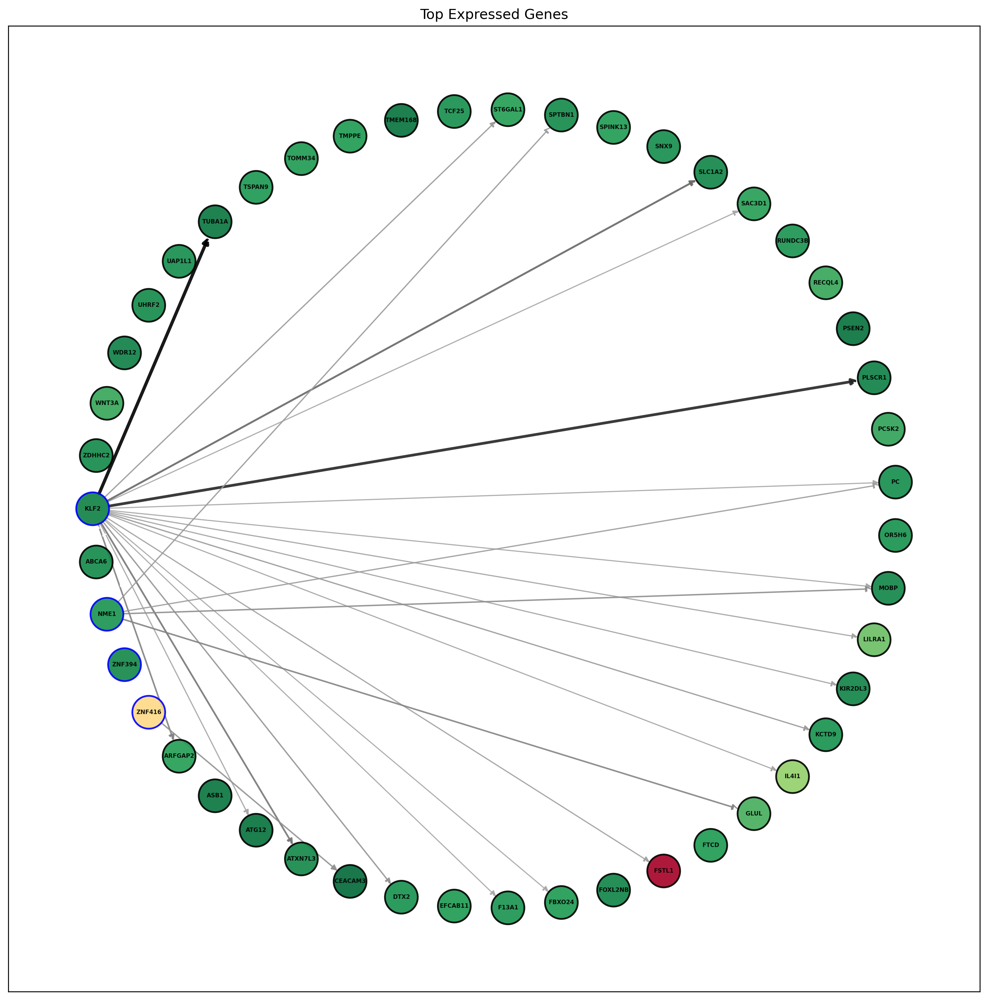

In [62]:
n_genes = 50
gene_stats = stats.head(n_genes)

G = grn.create_scenic_network(gene_stats, sdf)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 15

feature_column = "percent_nonzero"

pos = nx.kamada_kawai_layout(G)
# pos = nx.spring_layout(G)
# pos = nx.spectral_layout(G)
pos = nx.shell_layout(G)
# pos = nx.multipartite_layout(G, subset_key='gene_type')

colors = np.array([G.nodes[n].get(feature_column) for n in G.nodes]) 
ecolors = ["blue" if G.nodes[n].get("is_tf", False) else "k" for n in G.nodes]
edge_weights = ut.min_max(np.array(list(nx.get_edge_attributes(G, "weight").values())))

e_thresh = 0.25
edge_weights = np.where(edge_weights > e_thresh, edge_weights, 0)
edge_weights = np.log1p(edge_weights) * 4

# Draw the graph
nx.draw_networkx(G, pos, 
        node_color=colors,
        edgecolors=ecolors, #color of node border
        node_shape='o',
        cmap='RdYlGn',
        node_size = 800,
        linewidths = 1.5,
        with_labels = True,
        font_color = "k",
        font_size = 5,
        font_family = "sans-serif",
        font_weight = "bold",
        horizontalalignment = "center",
        verticalalignment = "center",
        edge_cmap = plt.cm.get_cmap('binary'),
        edge_color = edge_weights,
        alpha=0.9,         
        width = edge_weights,
        arrows = True,
        arrowsize = 10,
)

plt.title("Top Expressed Genes")

/home/cstansbu/git_repositories/ONT-single-cell/notebooks/regulatory_network.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Kamada-Kawai layout (assumed default)
/tmp/ipykernel_1088334/2707925653.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  edge_cmap = plt.cm.get_cmap('binary'),


Text(0.5, 1.0, 'KLF2 Circuit')

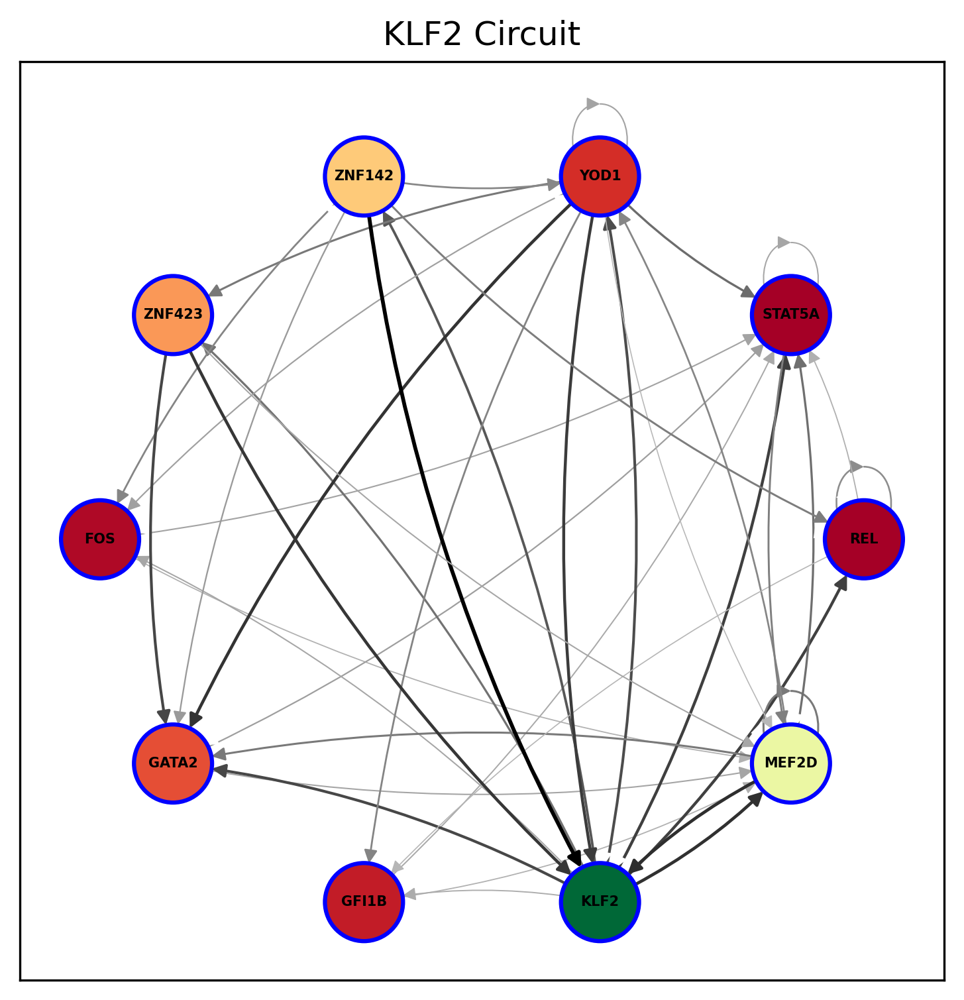

In [93]:
genes = [
    'GATA2', 
    'GFI1B',
    'STAT5A',
    'REL',
    'FOS',
    'KLF2',
]

regs = grn.get_regulators(sdf, 'KLF2', 5)
genes = list(set(regs + genes))

gene_stats = stats[stats['gene_name'].isin(genes)]

G = grn.create_scenic_network(gene_stats, sdf)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6, 6

feature_column = "percent_nonzero"

pos = nx.shell_layout(G)

colors = np.array([G.nodes[n].get(feature_column) for n in G.nodes]) 
ecolors = ["blue" if G.nodes[n].get("is_tf", False) else "k" for n in G.nodes]
edge_weights = ut.min_max(np.array(list(nx.get_edge_attributes(G, "weight").values())))

e_thresh = 0.2
edge_weights = np.where(edge_weights > e_thresh, edge_weights, 0)
edge_weights = np.log1p(edge_weights) * 2

# Draw the graph
nx.draw_networkx(G, pos, 
        node_color=colors,
        edgecolors=ecolors, #color of node border
        node_shape='o',
        cmap='RdYlGn',
        node_size = 800,
        linewidths = 1.5,
        with_labels = True,
        font_color = "k",
        font_size = 5,
        font_family = "sans-serif",
        font_weight = "bold",
        horizontalalignment = "center",
        verticalalignment = "center",
        edge_cmap = plt.cm.get_cmap('binary'),
        edge_color = edge_weights,    
        width = edge_weights,
        arrows = True,
        arrowsize = 10,
       connectionstyle="arc3,rad=0.1",
)

plt.title("KLF2 Circuit")

In [84]:
sdf.shape

(27015, 1605)

In [86]:
reload(grn)

grn.get_regulators(sdf, 'KLF2')
    

['ZNF142',
 'MEF2D',
 'ZNF423',
 'YOD1',
 'ZFPM1',
 'PQBP1',
 'ASCC1',
 'PHTF1',
 'PDLIM5',
 'NONO']